In [72]:
def generate_image(prompt, model):
    image = model(
        prompt, num_inference_steps=CFG.image_gen_steps,
        generator=CFG.generator,
        guidance_scale=CFG.image_gen_guidance_scale
    ).images[0]
    
    image = image.resize(CFG.image_gen_size)
    return image

In [4]:
# pip install diffusers --upgrade
# pip install invisible_watermark transformers accelerate safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 56.4 MB/s eta 0:00:00:00:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
!pip install diffusers --upgrade
!pip install invisible_watermark transformers accelerate safetensors
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 21.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 17.4 MB/s eta 0:00:0000:010:01


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-05-30 18:03:04.442517: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-30 18:03:04.442650: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-30 18:03:04.574985: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

(…)diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

(…)diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.28.0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [2]:
def create_save(prompt,no):
    images = pipe(prompt=prompt).images[0]
    image_path = f"/kaggle/working/scene{no}.jpeg"
    images.save(image_path)
    print(f"Image saved at {image_path}")

In [7]:
# print('enter 4 scenes on the comic page')
# prompt_list=list()
# for i in range(4):
#     prompt_list.append(input(f"scene {i+1}"))
    
# for i in range(len(prompt_list)):
#     create_save(prompt_list[i],i+1)


In [3]:
# prompt_list=['detective reaches crime site in car','detective moves towards a door','detective observes a shadow behind him','detective is chasing someone']
# prompt_list=['spaceships landing on earth','aliens coming out of spaceships','aliens attacking city','destroyed city']

prompt_list=['a knight on hourse alone in dark forest','a knight finds a young girl in dark forest','a knight saving a young girl in dark forest', 'a knight and a young girl in a beautiful landscape']

for i in range(len(prompt_list)):
    create_save(prompt_list[i],i+1)

  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at /kaggle/working/scene1.jpeg


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at /kaggle/working/scene2.jpeg


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at /kaggle/working/scene3.jpeg


  0%|          | 0/50 [00:00<?, ?it/s]

Image saved at /kaggle/working/scene4.jpeg


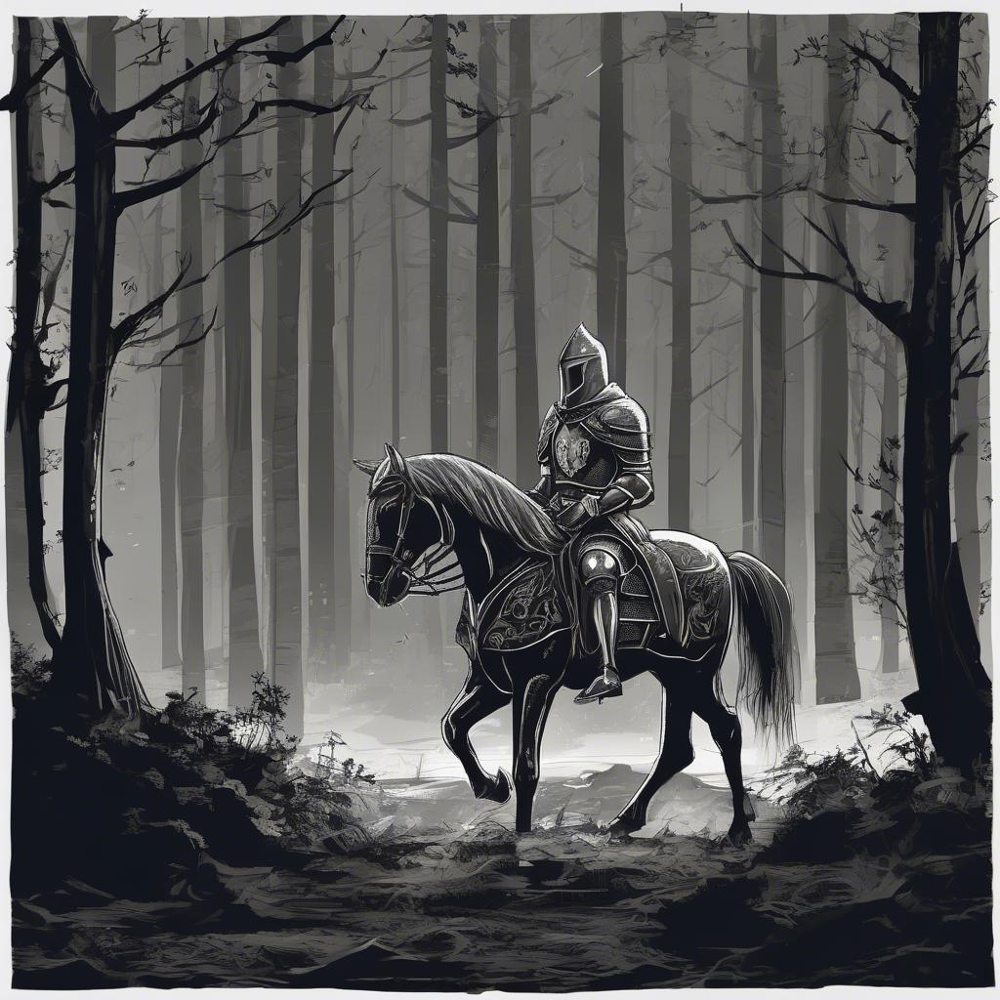

In [7]:
from PIL import Image

Image.open('/kaggle/working/scene1.jpeg')

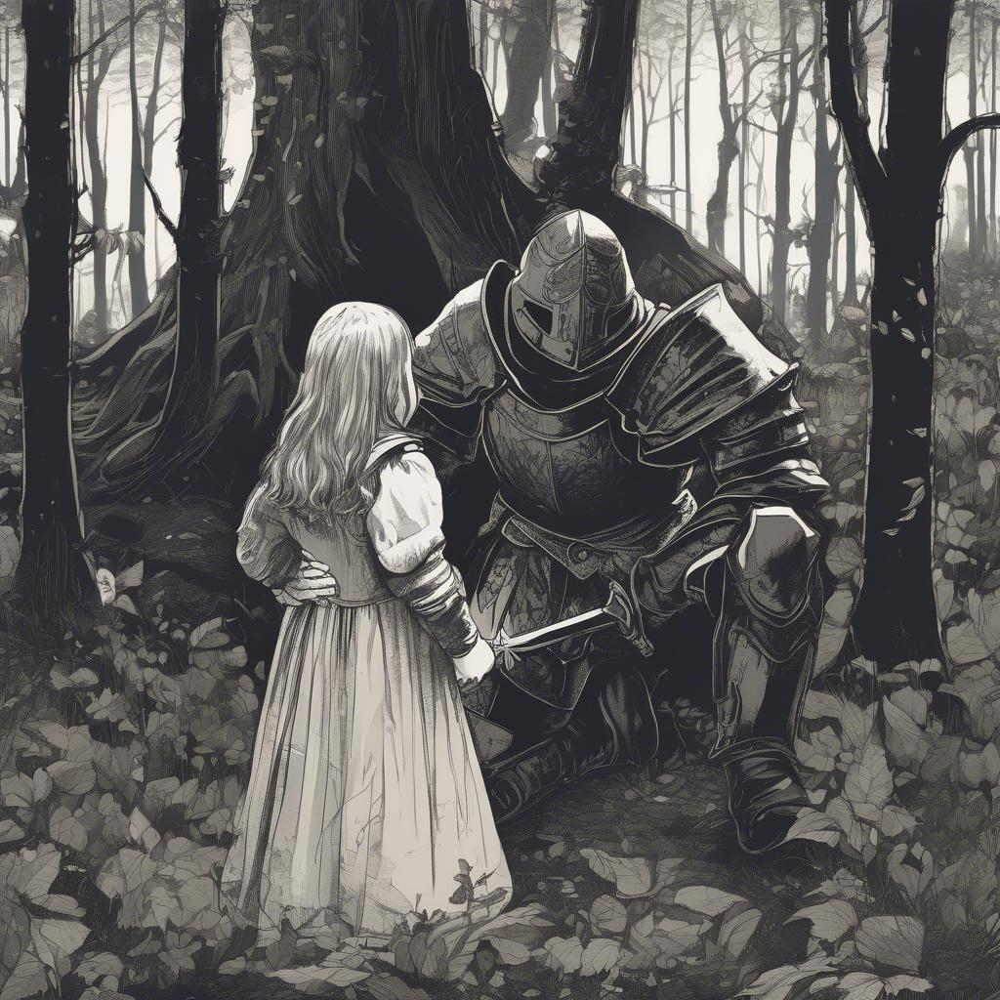

In [5]:
Image.open('/kaggle/working/scene2.jpeg')

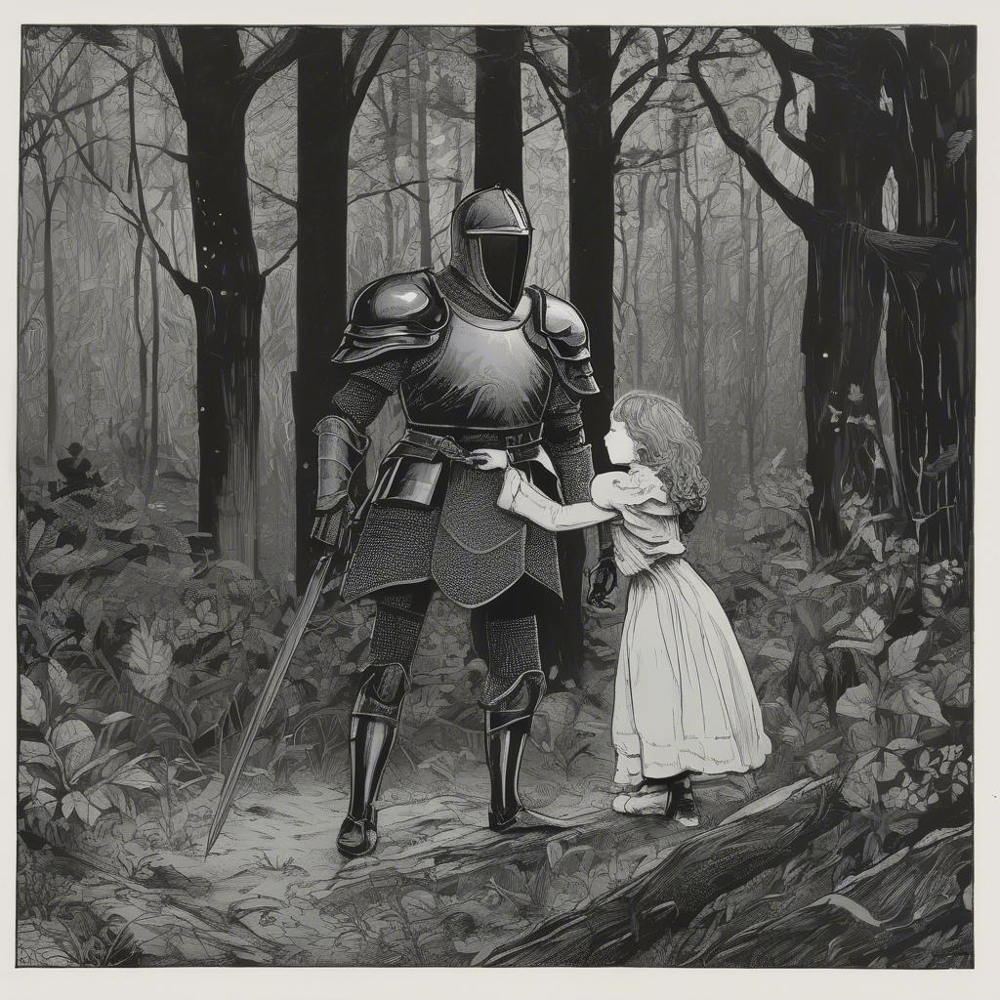

In [6]:
Image.open('/kaggle/working/scene3.jpeg')

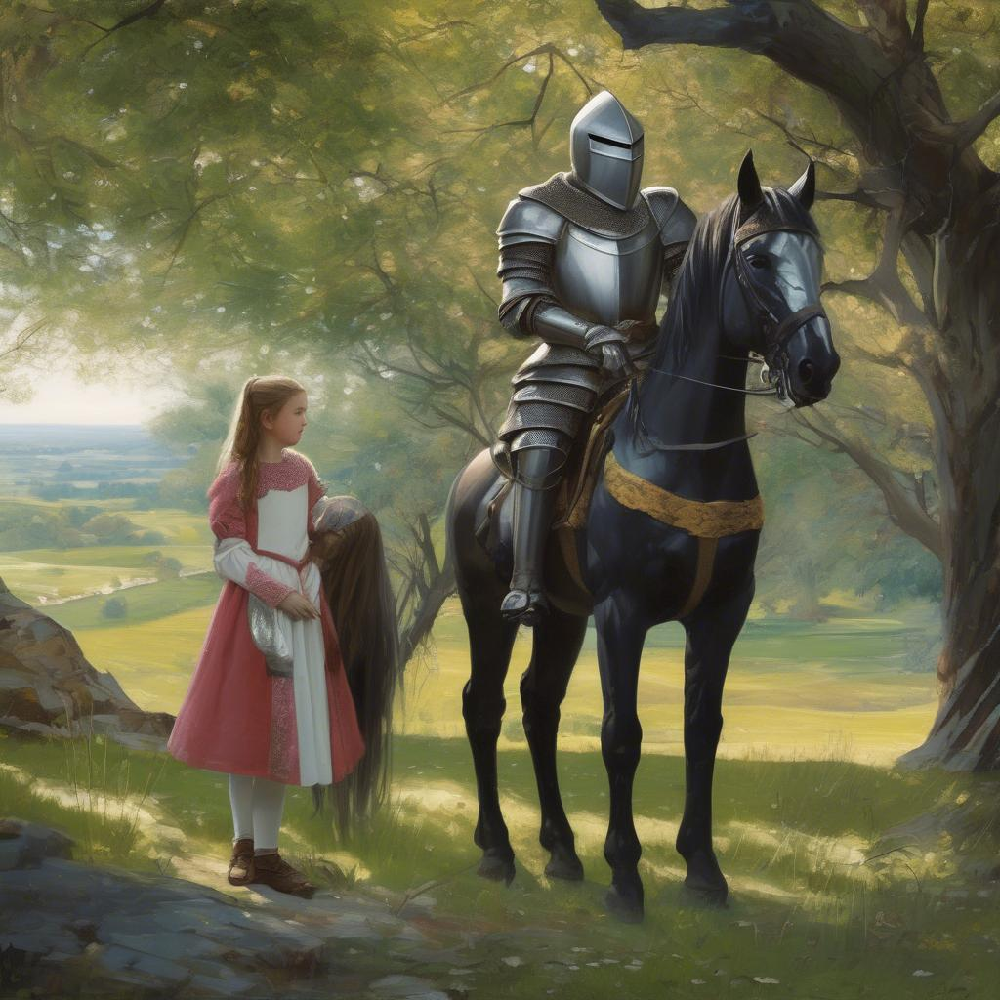

In [8]:
Image.open('/kaggle/working/scene4.jpeg')

In [ ]:
# prompt_list=['superman flying in sky', 'superman fighting batman', 'batman punches superman', 'batman sits in bat car']

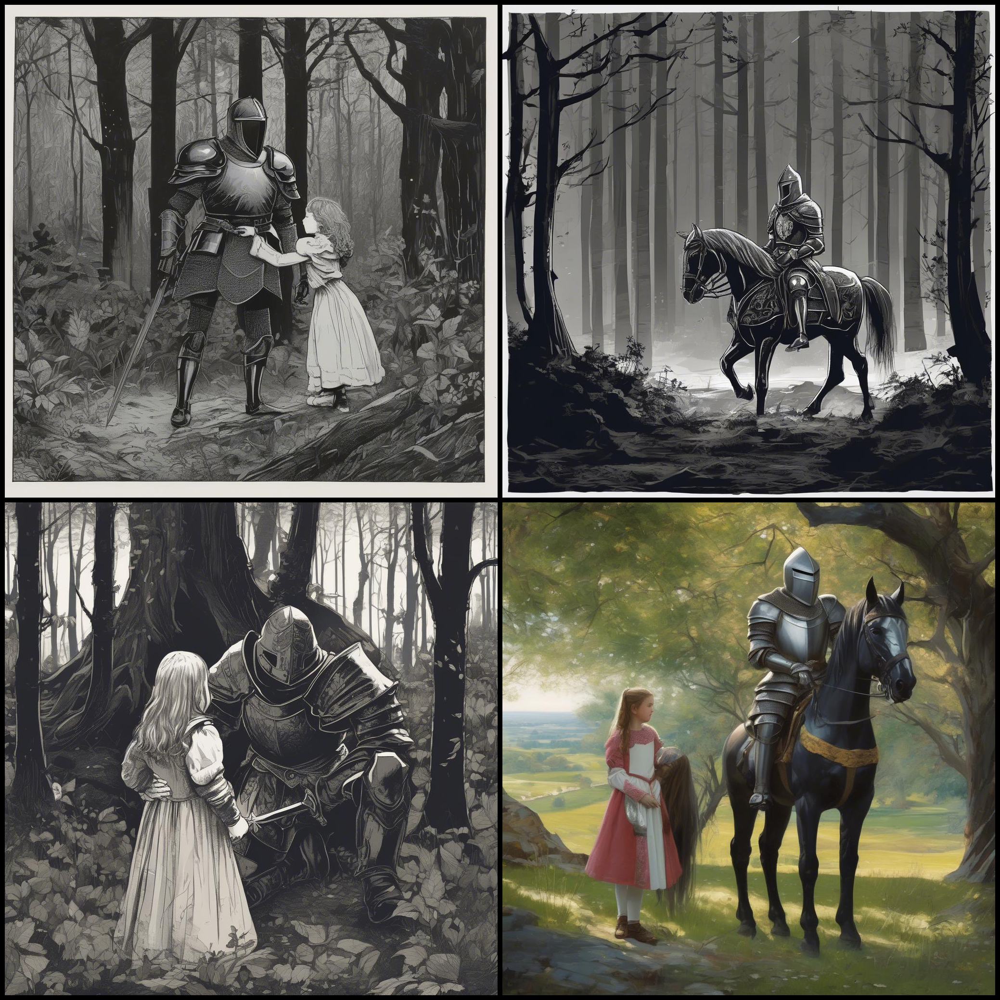

In [9]:
import os
import glob
from PIL import Image


images_dir = '/kaggle/working/'

output_dir = '/kaggle/working/'


# jpg_paths = [os.path.join(images_dir, filename) for filename in os.listdir(images_dir) if filename.lower().endswith('.png')]
jpg_paths = [os.path.join(images_dir, filename) for filename in os.listdir(images_dir) if filename.lower().startswith('scene')]
for i, paths in enumerate(zip(*[iter(jpg_paths)] * 4), start=1):
    images_list = [Image.open(path) for path in paths]
    
    
    
x_offset = 10
y_offset = 10

total_height = (images_list[0].size[1])*2 +(3*y_offset)
    

total_width = (images_list[0].size[0])*2 +(3*x_offset)

new_im = Image.new('RGB', (total_width, total_height))

width=images_list[0].size[0]
height=images_list[0].size[1]



new_im.paste(images_list[1],(x_offset , y_offset))
new_im.paste(images_list[0],(width+(2*x_offset) , y_offset))
new_im.paste(images_list[3],(x_offset , 2*(y_offset)+height))
new_im.paste(images_list[2],(width+2*(x_offset), 2*(y_offset)+height))

new_im.save('/kaggle/working/combined.jpeg')
new_im



In [10]:
!pip install transformers

In [1]:
import tensorflow as tf
from transformers import GPT2LMHeadModel, GPT2Tokenizer

2024-05-30 18:45:46.888104: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-30 18:45:46.888302: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-30 18:45:47.080891: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
tokenizer = GPT2Tokenizer.from_pretrained("gpt2-large")

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/666 [00:00<?, ?B/s]

In [3]:
model = GPT2LMHeadModel.from_pretrained("gpt2-large", pad_token_id=tokenizer.eos_token_id)

model.safetensors:   0%|          | 0.00/3.25G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

In [9]:
# sentence=f"{prompt_list[0]}, {prompt_list[1]}, {prompt_list[2]}, {prompt_list[3]}"
sentence='a knight on hourse alone in dark forest finds a young girl in dark fores. Then he saves her, they finally cross the dark forest and find themselves in a beautiful landscape'

In [10]:
input_ids = tokenizer.encode(sentence, return_tensors='pt')

In [11]:
# generate text until the output length (which includes the context length) reaches 50
output = model.generate(input_ids, max_length=100, num_beams=10, no_repeat_ngram_size=2, early_stopping=True)

In [12]:
result=tokenizer.decode(output[0], skip_special_tokens=True)


In [13]:
print(result)
# new_im

a knight on hourse alone in dark forest finds a young girl in dark fores. Then he saves her, they finally cross the dark forest and find themselves in a beautiful landscape. But the girl is not what she appears to be. She is in fact a witch, and she wants to kill the knight. The knight has no choice but to save her.

This is the story of a knight and a girl. It is a fairy tale, but it is also a true story.
